In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
import sys
sys.path.append('..')

from tma_utils.tma_baseline_models import Baseline
from tma_utils.tma_baseline_evaluation import Evaluation
from utils.eval_utils_survival import EvaluationAMIL

In [9]:
# set dirs
fold_dir = '../splits/task_3_survival_prediction_HE_Ostercappeln_100/'
plots_dir = '../tma_figures/'

In [10]:
# load annotations
annotation_file = '../tma_annotations/Ostercappeln_numeric_dummies_ids.csv'

# read annotations
anno_df = pd.read_csv(annotation_file)
anno_df.head()

,case_id,slide_id,time,event,Alter_bei_ED,Sex,Rauchen_kat,Grading_kat4_1,Grading_kat4_2,Grading_kat4_3,Grading_kat4_4,Staging_1,Staging_2,Staging_3,Staging_4
0,1,slide_001,1690,0,70.748802,0,1,0,0,1,0,1,0,0,0
1,2,slide_002,900,1,67.753593,0,1,0,1,0,0,1,0,0,0
2,3,slide_003,3011,1,59.268994,0,1,0,1,0,0,0,0,1,0
3,4,slide_004,2805,0,45.582478,1,1,0,0,1,0,0,0,1,0
4,5,slide_005,337,1,67.718001,0,1,0,0,1,0,1,0,0,0


### Collect baseline results

In [11]:
from lifelines.utils import concordance_index
from sklearn.metrics import roc_auc_score

In [12]:
# collect data from RSF method
cph_cindex = {'val': [], 'test': []}
cph_cindex_td = {'val': [], 'test': []}
cph_ibs = {'val': [], 'test': []}
cph_inbll = {'val': [], 'test': []}

# collect data from validation splits
cph_times = {'val': [], 'test': []}
cph_events = {'val': [], 'test': []}
cph_preds = {'val': [], 'test': []}
cph_group = {'val': [], 'test': []}

for fold_idx in range(10):
    
    # read fold data 
    fold_file = '_'.join(('splits', str(fold_idx), 'bool')) + '.csv'
    fold_df = pd.read_csv(os.path.join(fold_dir, fold_file), names=['slide_id', 'train', 'val', 'test'], header=0)
    
    data = {}
    # collect tabular data for each data split 
    for split in ['train', 'val', 'test']:
        ids = fold_df.slide_id[fold_df[split]]
        data[split] = anno_df.iloc[:, 2:].loc[anno_df.slide_id.isin(ids)]

    # init cph model  
    cph = Baseline(algorithm='CPH', data=data, penalizer=0.1)

    # fit cph model
    cph.fit()

    for split in ['val', 'test']:

        # eval cph model
        cph_ev = Evaluation(model=cph.model, dataset=data[split])

        # get c-index
        time, event, pred = cph_ev.ev._predict_risk_data()
        c_index = concordance_index(time, -pred, event)
        cph_cindex[split].append(c_index)
        
        # compute risk group
        group = (pred > np.median(pred)).astype(int)
        cph_group[split].append(group)

        cph_times[split].append(time)
        cph_events[split].append(event)
        cph_preds[split].append(pred)

        # get pycox predictions
        cph_ev.compute_metrics()
        _, c_index_td, ibs, inbll = cph_ev.return_results()

        cph_cindex_td[split].append(c_index_td)
        cph_ibs[split].append(ibs)
        cph_inbll[split].append(inbll)


Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...



In [13]:
# collect data from RSF method
rsf_cindex = {'val': [], 'test': []}
rsf_cindex_td = {'val': [], 'test': []}
rsf_ibs = {'val': [], 'test': []}
rsf_inbll = {'val': [], 'test': []}

# collect data from validation splits
rsf_times = {'val': [], 'test': []}
rsf_events = {'val': [], 'test': []}
rsf_preds = {'val': [], 'test': []}
rsf_group = {'val': [], 'test': []}

for fold_idx in range(10):
    
    # read fold data 
    fold_file = '_'.join(('splits', str(fold_idx), 'bool')) + '.csv'
    fold_df = pd.read_csv(os.path.join(fold_dir, fold_file), names=['slide_id', 'train', 'val', 'test'], header=0)
    
    data = {}
    # collect tabular data for each data split 
    for split in ['train', 'val', 'test']:
        ids = fold_df.slide_id[fold_df[split]]
        data[split] = anno_df.iloc[:, 2:].loc[anno_df.slide_id.isin(ids)]

    # init rsf model  
    rsf = Baseline(algorithm='RSF', data=data, n_trees=200)

    # fit rsf model
    rsf.fit()

    for split in ['val', 'test']:

        # eval rsf model
        rsf_ev = Evaluation(model=rsf.model, dataset=data[split])

        # get c-index
        time, event, pred = rsf_ev.ev._predict_risk_data()
        c_index = concordance_index(time, -pred, event)
        rsf_cindex[split].append(c_index)
        
        # compute risk group
        group = (pred > np.median(pred)).astype(int)
        rsf_group[split].append(group)

        rsf_times[split].append(time)
        rsf_events[split].append(event)
        rsf_preds[split].append(pred)

        # get pycox predictions
        rsf_ev.compute_metrics()
        _, c_index_td, ibs, inbll = rsf_ev.return_results()

        rsf_cindex_td[split].append(c_index_td)
        rsf_ibs[split].append(ibs)
        rsf_inbll[split].append(inbll)


Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...

Collect patient predictions...



In [14]:
# collect data from deepsurv method
deepsurv_cindex = {'val': [], 'test': []}
deepsurv_cindex_td = {'val': [], 'test': []}
deepsurv_ibs = {'val': [], 'test': []}
deepsurv_inbll = {'val': [], 'test': []}

# collect data from validation splits
deepsurv_times = {'val': [], 'test': []}
deepsurv_events = {'val': [], 'test': []}
deepsurv_preds = {'val': [], 'test': []}
deepsurv_group = {'val': [], 'test': []}

for fold_idx in range(10):
    
    # read fold data 
    fold_file = '_'.join(('splits', str(fold_idx), 'bool')) + '.csv'
    fold_df = pd.read_csv(os.path.join(fold_dir, fold_file), names=['slide_id', 'train', 'val', 'test'], header=0)
    
    data = {}
    # collect tabular data for each data split 
    for split in ['train', 'val', 'test']:
        ids = fold_df.slide_id[fold_df[split]]
        data[split] = anno_df.iloc[:, 2:].loc[anno_df.slide_id.isin(ids)]

    # init deepsurv model  
    deepsurv = Baseline(algorithm='DeepSurv', data=data, n_neurons=32)

    # fit deepsurv
    deepsurv.fit(batch_size=32)

    for split in ['val', 'test']:

        # eval deepsurv model
        deepsurv_ev = Evaluation(model=deepsurv.model, dataset=data[split])

        # get c-index
        time, event, pred = deepsurv_ev.ev._predict_risk_data()
        c_index = concordance_index(time, -pred, event)
        deepsurv_cindex[split].append(c_index)
        
        # compute risk group
        group = (pred > np.median(pred)).astype(int)
        deepsurv_group[split].append(group)

        deepsurv_times[split].append(time)
        deepsurv_events[split].append(event)
        deepsurv_preds[split].append(-pred)

        # get predictions
        deepsurv_ev.compute_metrics()
        _, c_index_td, ibs, inbll = deepsurv_ev.return_results()

        deepsurv_cindex_td[split].append(c_index_td)
        deepsurv_ibs[split].append(ibs)
        deepsurv_inbll[split].append(inbll)

   Learning rate 4e-05
   Batch size 32

0:	[0s / 0s],		train_loss: 2.8995,	val_loss: 3.0764
1:	[0s / 0s],		train_loss: 2.9019,	val_loss: 3.0997
2:	[0s / 0s],		train_loss: 2.8471,	val_loss: 3.1217
3:	[0s / 0s],		train_loss: 2.8749,	val_loss: 3.1400
4:	[0s / 0s],		train_loss: 2.8581,	val_loss: 3.1497
5:	[0s / 0s],		train_loss: 2.8877,	val_loss: 3.1345
6:	[0s / 0s],		train_loss: 2.8481,	val_loss: 3.1476
7:	[0s / 0s],		train_loss: 2.8631,	val_loss: 3.1559
8:	[0s / 0s],		train_loss: 2.8675,	val_loss: 3.1590
9:	[0s / 0s],		train_loss: 2.8776,	val_loss: 3.1464
10:	[0s / 0s],		train_loss: 2.8414,	val_loss: 3.1581
Collect patient predictions...

Collect patient predictions...

   Learning rate 4e-05
   Batch size 32

0:	[0s / 0s],		train_loss: 2.9243,	val_loss: 2.9710
1:	[0s / 0s],		train_loss: 2.9637,	val_loss: 2.9666
2:	[0s / 0s],		train_loss: 3.0538,	val_loss: 2.9645
3:	[0s / 0s],		train_loss: 2.9739,	val_loss: 2.9790
4:	[0s / 0s],		train_loss: 3.0559,	val_loss: 2.9919
5:	[0s / 0s],		train_

### Collect MIL results

In [17]:
settings = {
    'csv_path': '../tma_csvfiles/Ostercappeln_HE_survival.csv',
    'data_root_dir': '../../../data/TMA/Ostercappeln/HE/',
    'drop_out': True,
    'feature_dir': 'wsi_features',
    'model_size': 'small',
    'model_type': 'mil',
    'split_idx': 0,
    'split_dir': '../splits/task_3_survival_prediction_HE_Ostercappeln_100/',
    'n_classes': 2,
    'models_dir': '../results/Ost_HE_surv_mil_s1/',
    'k': 10,
    'print_data_info': False,
    'print_model_info': False,
    }

In [11]:
# collect data from mil method
mil_cindex = {'val': [], 'test': []}
mil_cindex_td = {'val': [], 'test': []}
mil_ibs = {'val': [], 'test': []}
mil_inbll = {'val': [], 'test': []}

# collect data from validation splits
mil_times = {'val': [], 'test': []}
mil_events = {'val': [], 'test': []}
mil_preds = {'val': [], 'test': []}
mil_group = {'val':[], 'test': []}

for fold_idx in range(10):
    settings.update(split_idx=fold_idx)

    # init model 
    mil_ev = EvaluationAMIL(settings)

    for split in ['val', 'test']:

        # compute c-index
        time, event, pred = mil_ev.predict_risk(split=split)
        c_index = concordance_index(time, -pred, event)
        mil_cindex[split].append(c_index)
        
        # compute risk group
        group = (pred > np.median(pred)).astype(int)
        mil_group[split].append(group)

        mil_times[split].append(time)
        mil_events[split].append(event)
        mil_preds[split].append(pred)
        
        # compute pycox metrics
        mil_ev.compute_metrics(split=split)
        _, c_index_td, ibs, inbll = mil_ev.return_results()

        mil_cindex_td[split].append(c_index_td)
        mil_ibs[split].append(ibs)
        mil_inbll[split].append(inbll)

Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative 

### Collect amil results

In [18]:
settings.update(
    model_type='amil', 
    models_dir='../results/Ost_HE_AMIL_s1/'
)

# collect data from amil method
amil_cindex = {'val': [], 'test': []}
clam_cindex_td = {'val': [], 'test': []}
clam_ibs = {'val': [], 'test': []}
clam_inbll = {'val': [], 'test': []}

# collect data from validation splits
clam_times = {'val': [], 'test': []}
clam_events = {'val': [], 'test': []}
clam_preds = {'val': [], 'test': []}
clam_group = {'val': [], 'test': []}

for fold_idx in range(10):
    settings.update(split_idx=fold_idx)

    # init model 
    clam_ev = EvaluationAMIL(settings)

    for split in ['val', 'test']:  
        # compute c-index
        time, event, pred = clam_ev.predict_risk(split=split)
        c_index = concordance_index(time, -pred, event)
        clam_cindex[split].append(c_index)
        
        # compute risk group
        group = (pred > np.median(pred)).astype(int)
        clam_group[split].append(group)

        clam_times[split].append(time)
        clam_events[split].append(event)
        clam_preds[split].append(pred)

        # compute pycox metrics
        clam_ev.compute_metrics(split=split)
        _, c_index_td, ibs, inbll = clam_ev.return_results()

        clam_cindex_td[split].append(c_index_td)
        clam_ibs[split].append(ibs)
        clam_inbll[split].append(inbll)

Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative 

### Collect clam tiny results

In [15]:
settings.update(
    model_type='clam_sb', 
    model_size='tiny',
    models_dir='../results/Ost_HE_surv_NoClustering_tiny_s1/'
)

# collect data from clam method
clam_noCl_tiny_cindex = {'val': [], 'test': []}
clam_noCl_tiny_cindex_td = {'val': [], 'test': []}
clam_noCl_tiny_ibs = {'val': [], 'test': []}
clam_noCl_tiny_inbll = {'val': [], 'test': []}

# collect data from validation splits
clam_noCl_tiny_times = {'val': [], 'test': []}
clam_noCl_tiny_events = {'val': [], 'test': []}
clam_noCl_tiny_preds = {'val': [], 'test': []}
clam_noCl_tiny_group = {'val': [], 'test': []}

for fold_idx in range(10):
    settings.update(split_idx=fold_idx)

    # init model 
    clam_noCl_tiny_ev = EvaluationAMIL(settings)

    for split in ['val', 'test']:  
        # compute c-index
        time, event, pred = clam_noCl_tiny_ev.predict_risk(split=split)
        c_index = concordance_index(time, -pred, event)
        clam_noCl_tiny_cindex[split].append(c_index)
        
        # compute risk group
        group = (pred > np.median(pred)).astype(int)
        clam_noCl_tiny_group[split].append(group)

        clam_noCl_tiny_times[split].append(time)
        clam_noCl_tiny_events[split].append(event)
        clam_noCl_tiny_preds[split].append(pred)

        # compute pycox metrics
        clam_noCl_tiny_ev.compute_metrics(split=split)
        _, c_index_td, ibs, inbll = clam_noCl_tiny_ev.return_results()

        clam_noCl_tiny_cindex_td[split].append(c_index_td)
        clam_noCl_tiny_ibs[split].append(ibs)
        clam_noCl_tiny_inbll[split].append(inbll)

Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative 

### Collect clam single core results


In [16]:
settings.update(
    csv_path='../tma_csvfiles/Ostercappeln_HE_survival_singleCore.csv',
    feature_dir='single_features',
    model_type='clam_sb', 
    model_size='small',
    models_dir='../results/Ost_HE_surv_NoClustering_SingleCore_s1/',
    split_dir= '../splits/task_3_survival_prediction_HE_Ostercappeln_SingleCores_100/',
)

# collect data from clam method
clam_single_cindex = {'val': [], 'test': []}
clam_single_cindex_td = {'val': [], 'test': []}
clam_single_ibs = {'val': [], 'test': []}
clam_single_inbll = {'val': [], 'test': []}

# collect data from validation splits
clam_single_times = {'val': [], 'test': []}
clam_single_events = {'val': [], 'test': []}
clam_single_preds = {'val': [], 'test': []}
clam_single_group = {'val': [], 'test': []}

for fold_idx in range(10):
    settings.update(split_idx=fold_idx)

    # init model 
    clam_single_ev = EvaluationAMIL(settings)

    for split in ['val', 'test']:
        
        # compute c-index
        time, event, pred = clam_single_ev.predict_risk(split=split)
        c_index = concordance_index(time, -pred, event)
        clam_single_cindex[split].append(c_index)

        # compute risk group
        group = (pred > np.median(pred)).astype(int)
        clam_single_group[split].append(group)

        clam_single_times[split].append(time)
        clam_single_events[split].append(event)
        clam_single_preds[split].append(pred)

        # compute pycox metrics
        clam_single_ev.compute_metrics(split=split)
        _, c_index_td, ibs, inbll = clam_single_ev.return_results()

        clam_single_cindex_td[split].append(c_index_td)
        clam_single_ibs[split].append(ibs)
        clam_single_inbll[split].append(inbll)

Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative 

### Collect Ki67 results

In [17]:
settings.update(
    data_root_dir='../../../data/TMA/Ostercappeln/Ki67/',
    csv_path='../tma_csvfiles/Ostercappeln_Ki67_survival.csv',
    feature_dir='wsi_features',
    model_type='clam_sb', 
    models_dir='../results/Ost_Ki67_surv_NoCl_s1/',
    split_dir= '../splits/task_3_survival_prediction_Ki67_Ostercappeln_100/',
)

# collect data from clam method
clam_ki67_cindex = {'val': [], 'test': []}
clam_ki67_cindex_td = {'val': [], 'test': []}
clam_ki67_ibs = {'val': [], 'test': []}
clam_ki67_inbll = {'val': [], 'test': []}

# collect data from validation splits
clam_ki67_times = {'val': [], 'test': []}
clam_ki67_events = {'val': [], 'test': []}
clam_ki67_preds = {'val': [], 'test': []}
clam_ki67_group = {'val': [], 'test': []}

for fold_idx in range(10):
    settings.update(split_idx=fold_idx)

    # init model 
    clam_ki67_ev = EvaluationAMIL(settings)

    for split in ['val', 'test']:
        
        # compute c-index
        time, event, pred = clam_ki67_ev.predict_risk(split=split)
        c_index = concordance_index(time, -pred, event)
        clam_ki67_cindex[split].append(c_index)

        # compute risk group
        group = (pred > np.median(pred)).astype(int)
        clam_ki67_group[split].append(group)

        clam_ki67_times[split].append(time)
        clam_ki67_events[split].append(event)
        clam_ki67_preds[split].append(pred)

        # compute pycox metrics
        clam_ki67_ev.compute_metrics(split=split)
        _, c_index_td, ibs, inbll = clam_ki67_ev.return_results()

        clam_ki67_cindex_td[split].append(c_index_td)
        clam_ki67_ibs[split].append(ibs)
        clam_ki67_inbll[split].append(inbll)

Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative hazard ... Done.
Done.
Compute evaluation metrics ... 
 Done.
Initialize data ... Done.
Initialize model ... Done.
Compute evaluation metrics ... 
 Estimate baseline cumulative 

### Visualize results

In [18]:
def result_to_df(result_dict, value_name, method_name):
    df = pd.DataFrame.from_dict(result_dict)
    df['fold'] = df.index
    df = pd.melt(df, id_vars=['fold'], value_vars=['val', 'test'], var_name='split', value_name=value_name)
    df['method'] = method_name
    return df 

#### Visualize C-index 

In [19]:
# convert to df in long format
cph_cindex_df = result_to_df(cph_cindex, value_name='c_index', method_name='CPH')
rsf_cindex_df = result_to_df(rsf_cindex, value_name='c_index', method_name='RSF')
deepsurv_cindex_df = result_to_df(deepsurv_cindex, value_name='c_index', method_name='DeepSurv')
nnet_cindex_df = result_to_df(nnet_cindex, value_name='c_index', method_name='Nnet')
mil_cindex_df = result_to_df(mil_cindex, value_name='c_index', method_name='MIL')
clam_cindex_df = result_to_df(clam_cindex, value_name='c_index', method_name='CLAM')
clam_20x_cindex_df = result_to_df(clam_20x_cindex, value_name='c_index', method_name='CLAM_20x')
clam_noCl_cindex_df = result_to_df(clam_noCl_cindex, value_name='c_index', method_name='AMIL')
clam_noCl_tiny_cindex_df = result_to_df(clam_noCl_tiny_cindex, value_name='c_index', method_name='AMIL_tiny')
clam_single_cindex_df = result_to_df(clam_single_cindex, value_name='c_index', method_name='AMIL_SC')
clam_ki67_cindex_df = result_to_df(clam_ki67_cindex, value_name='c_index', method_name='AMIL_Ki67')

# combine all 
# cindex_all = pd.concat([cph_cindex_df, rsf_cindex_df, deepsurv_cindex_df, nnet_cindex_df, mil_cindex_df, clam_cindex_df, clam_noCl_cindex_df])
cindex_all = pd.concat([cph_cindex_df, rsf_cindex_df, deepsurv_cindex_df, mil_cindex_df, clam_noCl_cindex_df, clam_single_cindex_df])

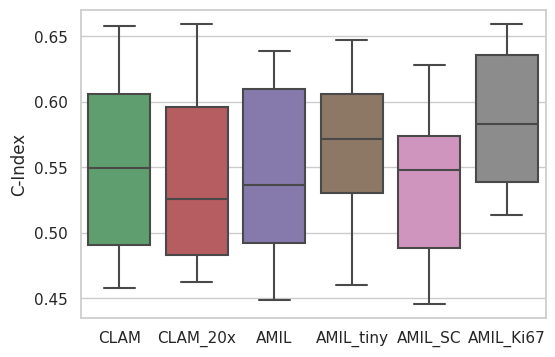

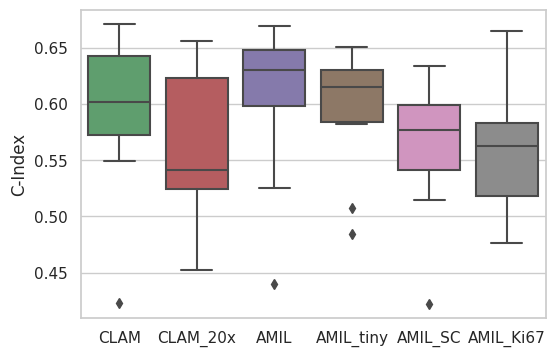

In [20]:
import seaborn as sns
sns.set_theme(style="whitegrid")

cindex_clam = pd.concat([clam_cindex_df, clam_20x_cindex_df, clam_noCl_cindex_df, clam_noCl_tiny_cindex_df, clam_single_cindex_df, clam_ki67_cindex_df])

# plot c-index as boxplot over all folds in val & test separately
for idx, split in enumerate(['val', 'test']):
    
    fig, ax = plt.subplots(1,1, figsize=(6,4))

    sns.boxplot(
        data=cindex_clam[cindex_clam.split == split], x='method', y='c_index',
        palette=sns.color_palette("deep")[2:], ax=ax
    )

    ax.set_ylabel("C-Index")
    ax.set_xlabel("")
    
    plt.savefig(os.path.join(plots_dir, 'cindex_clams_{}.svg'.format(split)), bbox_inches='tight')
    plt.show()


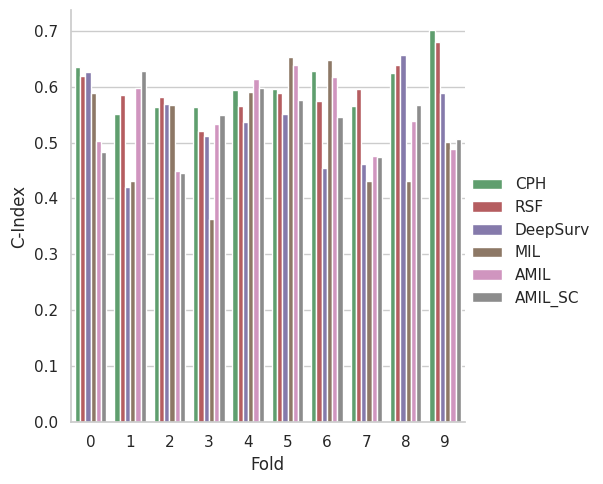

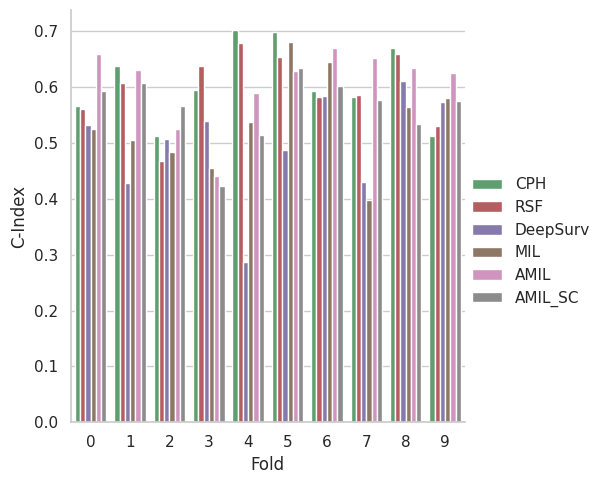

In [21]:
import seaborn as sns
sns.set_theme(style="whitegrid")


# plot c-index for each fold in val & test set separately
for idx, split in enumerate(['val', 'test']):

    g = sns.catplot(
        data=cindex_all[cindex_all.split == split], kind='bar', x='fold', y='c_index', hue='method',
        palette=sns.color_palette("deep")[2:], height=5, errorbar=None
    )

    # g.despine(left=True)
    g.set_axis_labels("Fold", "C-Index")
    g.legend.set_title("")
    
    plt.savefig(os.path.join(plots_dir, 'cindex_all_folds_{}.svg'.format(split)), bbox_inches='tight')
    plt.show()


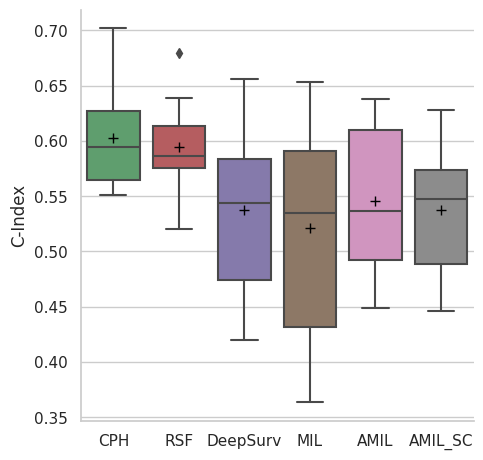

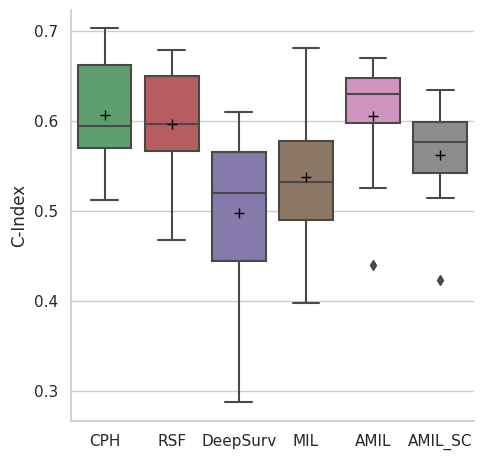

In [22]:
# plot c-index as boxplot over all folds in val & test separately
for idx, split in enumerate(['val', 'test']):

    g = sns.catplot(
        data=cindex_all[cindex_all.split == split], kind='box', x='method', y='c_index',
        palette=sns.color_palette("deep")[2:], height=5, errorbar=None,  showmeans=True,
            meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "7"} 
    )

    # s = sns.stripplot(data=results[results.split == split], x='method', y='cindex',
    # palette=sns.color_palette("deep")[2:])

    # g.despine(left=True)
    g.set_axis_labels("", "C-Index")
    # g.legend.set_title("")
    
#     # add rectangular areas
#     plt.axvspan(-0.4, 2.45, 0.01, 0.99, facecolor='xkcd:pastel green', alpha=0.2)
#     plt.axvspan(2.55, 5.4, 0.01, 0.99, facecolor='xkcd:pale yellow', alpha=0.2)
    
#     # add text
#     plt.text(0.12, 1.07, 'tabular-based', transform=ax.transAxes, fontsize=10)
#     plt.text(0.52, 1.07, 'image-based', transform=ax.transAxes, fontsize=10)
    
    
    plt.savefig(os.path.join(plots_dir, 'cindex_all_boxplot_{}.svg'.format(split)), bbox_inches='tight')
    plt.show()

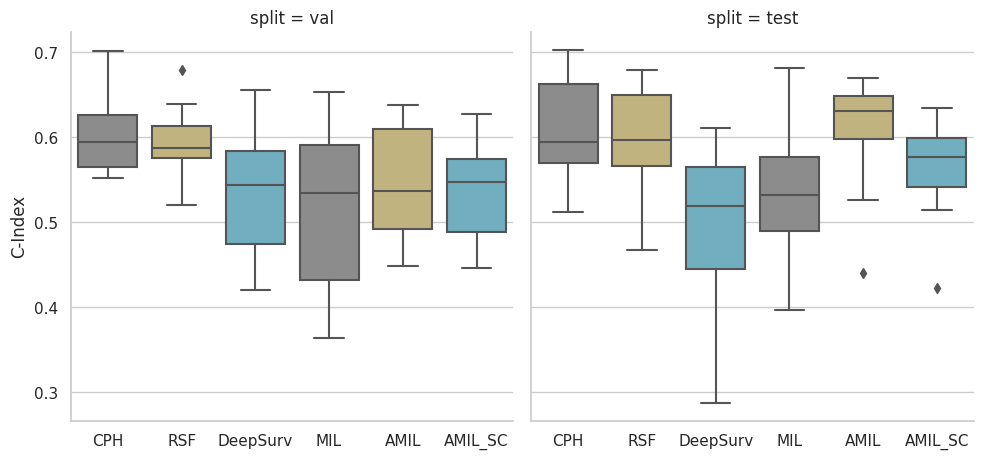

In [23]:
# plot c-index as boxplot over all folds in val & test together
g = sns.catplot(
    data=cindex_all, kind='box', x='method', y='c_index', col='split',
    palette=sns.color_palette("deep")[7:], height=5, errorbar=None
)

# g.despine(left=True)
g.set_axis_labels("", "C-Index")
# g.legend.set_title("")

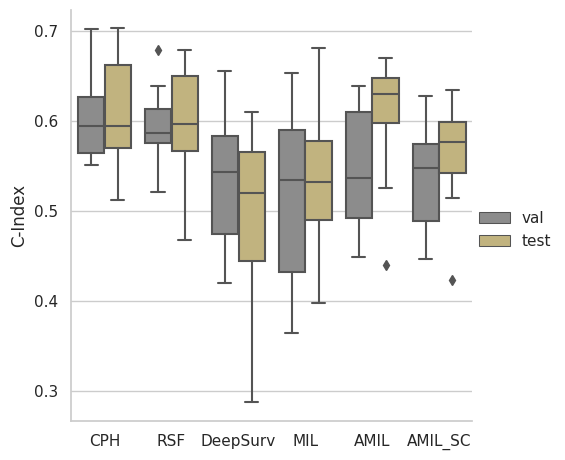

In [24]:
# plot c-index as boxplot over all folds in val & test together
g = sns.catplot(
    data=cindex_all, kind='box', x='method', y='c_index', hue='split',
    palette=sns.color_palette("deep")[7:], height=5, errorbar=None
)

# g.despine(left=True)
g.set_axis_labels("", "C-Index")
g.legend.set_title("")

In [25]:
# # convert to df in long format
# cph_cindex_df = result_to_df(cph_cindex_td, value_name='c_index_td', method_name='CPH')
# rsf_cindex_df = result_to_df(rsf_cindex_td, value_name='c_index_td', method_name='RSF')
# deepsurv_cindex_df = result_to_df(deepsurv_cindex_td, value_name='c_index_td', method_name='Deepsurv')
# nnet_cindex_df = result_to_df(nnet_cindex_td, value_name='c_index_td', method_name='Nnet')
# mil_cindex_df = result_to_df(mil_cindex_td, value_name='c_index_td', method_name='MIL')
# clam_cindex_df = result_to_df(clam_cindex_td, value_name='c_index_td', method_name='CLAM')
# clam_single_cindex_df = result_to_df(clam_single_cindex_td, value_name='c_index_td', method_name='clam_SC')
# clam_noCl_cindex_df = result_to_df(clam_noCl_cindex, value_name='c_index_td', method_name='amil')

# # combine all 
# # cindex_all = pd.concat([cph_cindex_df, rsf_cindex_df, deepsurv_cindex_df, nnet_cindex_df, mil_cindex_df, clam_cindex_df])
# cindex_all = pd.concat([cph_cindex_df, rsf_cindex_df, deepsurv_cindex_df, nnet_cindex_df, mil_cindex_df, clam_noCl_cindex_df])

In [26]:
# import seaborn as sns
# sns.set_theme(style="whitegrid")


# # plot c-index for each fold in val & test set separately
# for idx, split in enumerate(['val', 'test']):

#     g = sns.catplot(
#         data=cindex_all[cindex_all.split == split], kind='bar', x='fold', y='c_index_td', hue='method',
#         palette=sns.color_palette("deep")[2:], height=5, errorbar=None
#     )

#     # g.despine(left=True)
#     g.set_axis_labels("Fold", "C-Index td")
#     g.legend.set_title("")


In [27]:
# # plot c-index as boxplot over all folds in val & test separately
# for idx, split in enumerate(['val', 'test']):

#     g = sns.catplot(
#         data=cindex_all[cindex_all.split == split], kind='box', x='method', y='c_index_td',
#         palette=sns.color_palette("deep")[2:], height=5, errorbar=None
#     )

#     # s = sns.stripplot(data=results[results.split == split], x='method', y='cindex',
#     # palette=sns.color_palette("deep")[2:])

#     # g.despine(left=True)
#     g.set_axis_labels("", "C-Index td")
#     # g.legend.set_title("")

In [28]:
# # plot c-index as boxplot over all folds in val & test together
# g = sns.catplot(
#     data=cindex_all, kind='box', x='method', y='c_index_td', col='split',
#     palette=sns.color_palette("deep")[7:], height=5, errorbar=None
# )

# # g.despine(left=True)
# g.set_axis_labels("", "C-Index td")
# # g.legend.set_title("")

In [29]:
# # plot c-index as boxplot over all folds in val & test together
# g = sns.catplot(
#     data=cindex_all, kind='box', x='method', y='c_index_td', hue='split',
#     palette=sns.color_palette("deep")[7:], height=5, errorbar=None
# )

# # g.despine(left=True)
# g.set_axis_labels("", "C-Index td")
# g.legend.set_title("")

#### Visualize IBS

In [30]:
# convert to df in long format
cph_ibs_df = result_to_df(cph_ibs, value_name='ibs', method_name='CPH')
rsf_ibs_df = result_to_df(rsf_ibs, value_name='ibs', method_name='RSF')
deepsurv_ibs_df = result_to_df(deepsurv_ibs, value_name='ibs', method_name='DeepSurv')
nnet_ibs_df = result_to_df(nnet_ibs, value_name='ibs', method_name='Nnet')
mil_ibs_df = result_to_df(mil_ibs, value_name='ibs', method_name='MIL')
clam_ibs_df = result_to_df(clam_ibs, value_name='ibs', method_name='CLAM')
clam_20x_ibs_df = result_to_df(clam_20x_ibs, value_name='ibs', method_name='CLAM_20x')
clam_noCl_ibs_df = result_to_df(clam_noCl_ibs, value_name='ibs', method_name='AMIL')
clam_single_ibs_df = result_to_df(clam_single_ibs, value_name='ibs', method_name='AMIL_SC')
clam_noCl_tiny_ibs_df = result_to_df(clam_noCl_tiny_ibs, value_name='ibs', method_name='AMIL_tiny')
clam_ki67_ibs_df = result_to_df(clam_ki67_ibs, value_name='ibs', method_name='AMIL_Ki67')

# combine all 
ibs_all = pd.concat([cph_ibs_df, rsf_ibs_df, deepsurv_ibs_df, mil_ibs_df, clam_noCl_ibs_df, clam_single_ibs_df])

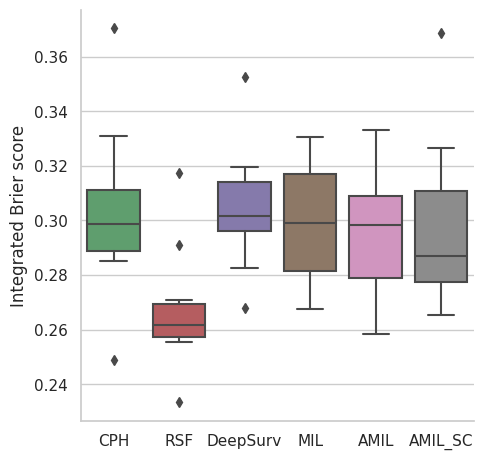

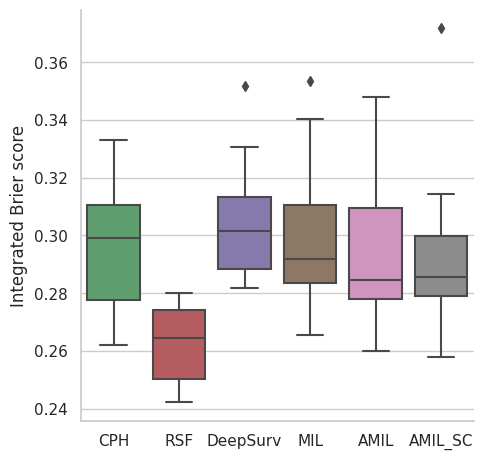

In [31]:
# plot c-index as boxplot over all folds in val & test separately
for idx, split in enumerate(['val', 'test']):

    g = sns.catplot(
        data=ibs_all[ibs_all.split == split], kind='box', x='method', y='ibs',
        palette=sns.color_palette("deep")[2:], height=5, errorbar=None
    )

    # s = sns.stripplot(data=results[results.split == split], x='method', y='cindex',
    # palette=sns.color_palette("deep")[2:])

    # g.despine(left=True)
    g.set_axis_labels("", "Integrated Brier score")
    # g.legend.set_title("")
    
    plt.savefig(os.path.join(plots_dir, 'brier_all_boxplot_{}.svg'.format(split)), bbox_inches='tight')
    plt.show()

#### Combine C-index and Brier score

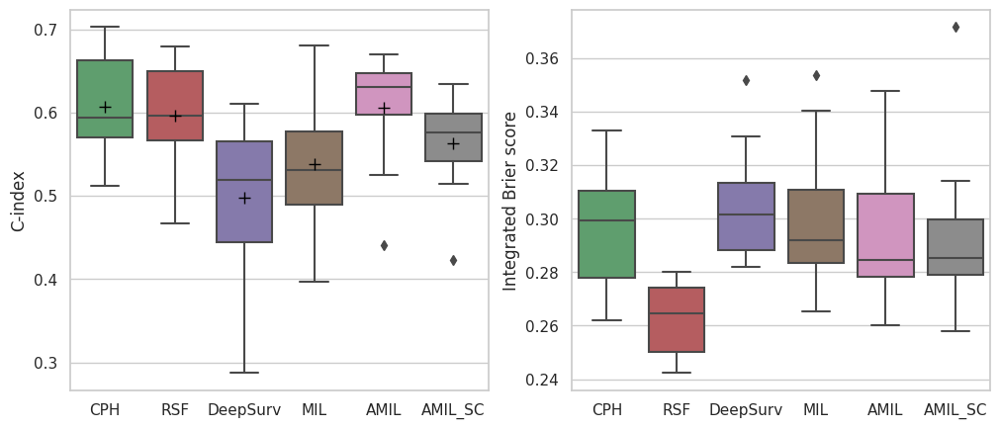

In [32]:
sns.set_theme(style="whitegrid")

fig, axs = plt.subplots(1, 2, figsize=(12,5))

c = sns.boxplot(
    data=cindex_all[cindex_all.split == 'test'], x='method', y='c_index',
        palette=sns.color_palette("deep")[2:], ax=axs[0], showmeans=True,
            meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "8"}
)
# axs[0].set_axis_labels("", "C-Index td")
axs[0].set_ylabel('C-index')
axs[0].set_xlabel('')


g = sns.boxplot(
    data=ibs_all[ibs_all.split == 'test'], x='method', y='ibs',
    palette=sns.color_palette("deep")[2:], ax=axs[1]
)
axs[1].set_ylabel('Integrated Brier score')
axs[1].set_xlabel('')

plt.subplots_adjust(wspace=0.2)
plt.savefig(os.path.join(plots_dir, 'combined_metrics.svg'), bbox_inches='tight')
plt.show()

### Show average C-index scores and std


In [33]:
cindex_all[cindex_all.split == 'test'].groupby('method').agg({'c_index': ['mean', 'median', 'std']}).round(decimals=4)

c_index                
            mean  median     std
method                          
AMIL      0.6055  0.6303  0.0712
AMIL_SC   0.5625  0.5767  0.0602
CPH       0.6071  0.5938  0.0694
DeepSurv  0.4979  0.5197  0.0959
MIL       0.5378  0.5316  0.0853
RSF       0.5964  0.5965  0.0654

### Visualize patient stratification with kaplan-maier curves

In [34]:
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test, multivariate_logrank_test
import seaborn as sns
sns.set_theme(style="white")

In [35]:
label_dict = {0: 'low risk', 1: 'high risk'}
color_dict = {0: 'b', 1: 'r'}

In [36]:
# for split in ['val', 'test']:

#     times = np.concatenate(rsf_times[split])
#     events = np.concatenate(rsf_events[split])
#     preds = np.concatenate(rsf_preds[split])
#     groups = np.concatenate(rsf_group[split])

#     # create results df 
#     df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})
#     # df = df.assign(risk_group = lambda x: (x['risk'] > x['risk'].median()).astype(int))
    
#     print(df['risk'].median())

In [37]:
# for split in ['val', 'test']:

#     times = np.concatenate(clam_times[split])
#     events = np.concatenate(clam_events[split])
#     preds = np.concatenate(clam_preds[split])

#     # create results df 
#     df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds})
#     df = df.assign(risk_group = lambda x: (x['risk'] > x['risk'].median()).astype(int))
    
#     print(df['risk'].median())
#     print(df.groupby('risk_group').count())

In [38]:
# for split in ['val', 'test']:

#     times = np.concatenate(rsf_times[split])
#     events = np.concatenate(rsf_events[split])
#     preds = np.concatenate(rsf_preds[split])
#     groups = np.concatenate(rsf_group[split])

#     # create results df 
#     df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

#     # perform logrank test with groups
#     res = multivariate_logrank_test(df.time, df.risk_group, df.event)

#     # fit kaplan-meier curves
#     kmf = KaplanMeierFitter()
#     fig, ax = plt.subplots(1,1)
#     for name, group_df in df.groupby('risk_group'):
#         kmf.fit(group_df.time, group_df.event, label=label_dict[name])
#         kmf.plot(show_censors=True, ci_show=False, color=color_dict[name])

#     if res.p_value < 0.05:
#         text = 'P-value: {:.2e} (*)'.format(res.p_value)
#     else:
#         text = 'P-value: {:.2e}'.format(res.p_value)
    
#     ax.text(0.36, 0.93, text, transform=ax.transAxes, fontsize=11)
#     ax.set_xlabel('Time (Years)')
#     ax.set_title('RSF KM-estimator, {} split'.format(split))
#     plt.show()

In [39]:
# for split in ['val', 'test']:
    
#     fig, axs = plt.subplots(2, 5, figsize=(15,7))
    
#     for fold_idx, ax in enumerate(axs.flatten()):
        
#         times = rsf_times[split][fold_idx]
#         events = rsf_events[split][fold_idx]
#         preds = rsf_preds[split][fold_idx]
#         groups = rsf_group[split][fold_idx]
        
#         # create results df 
#         df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

#         # perform logrank test with groups
#         res = multivariate_logrank_test(df.time, df.risk_group, df.event)

#         # fit kaplan-meier curves
#         kmf = KaplanMeierFitter()
#         # fig, ax = plt.subplots(1,1)
#         for name, group_df in df.groupby('risk_group'):
#             kmf.fit(group_df.time, group_df.event, label=label_dict[name])
#             kmf.plot(show_censors=True, ci_show=False, color=color_dict[name], ax=ax)

#         if res.p_value < 0.05:
#             text = 'P-value: {:.2e} (*)'.format(res.p_value)
#         else:
#             text = 'P-value: {:.2e}'.format(res.p_value)
            
#         if fold_idx > 0:
#             ax.get_legend().remove()

#         ax.text(0.36, 0.93, text, transform=ax.transAxes, fontsize=9)
#         ax.set_xlabel('Time (Years)')
#         ax.set_title('RSF: split {}, fold {}'.format(split, fold_idx))
        
#     # plt.subplots_adjust(hspace=0.2)
#     plt.tight_layout()
#     plt.show()       
        

In [40]:
# for split in ['val', 'test']:

#     times = np.concatenate(rsf_times[split])
#     events = np.concatenate(rsf_events[split])
#     preds = np.concatenate(rsf_preds[split])
    
#     c_index = concordance_index(times, -preds, events)
    

#     print('RSF: C-Index {}: {:.4f}'.format(split, c_index))

In [41]:
# for split in ['val', 'test']:

#     times = np.concatenate(deepsurv_times[split])
#     events = np.concatenate(deepsurv_events[split])
#     preds = np.concatenate(deepsurv_preds[split]).reshape(-1)
#     groups = np.concatenate(deepsurv_group[split]).reshape(-1)

#     # create results df 
#     df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

#     # perform logrank test with groups
#     res = multivariate_logrank_test(df.time, df.risk_group, df.event)

#     # fit kaplan-meier curves
#     kmf = KaplanMeierFitter()
#     fig, ax = plt.subplots(1,1)
#     for name, group_df in df.groupby('risk_group'):
#         kmf.fit(group_df.time, group_df.event, label=label_dict[name])
#         kmf.plot(show_censors=True, ci_show=False, color=color_dict[name])

#     if res.p_value < 0.05:
#         text = 'P-value: {:.2e} (*)'.format(res.p_value)
#     else:
#         text = 'P-value: {:.2e}'.format(res.p_value)
    
#     ax.text(0.36, 0.93, text, transform=ax.transAxes, fontsize=11)
#     ax.set_xlabel('Time (Years)')
#     plt.show()

In [42]:
# for split in ['val', 'test']:

#     times = np.concatenate(nnet_times[split])
#     events = np.concatenate(nnet_events[split])
#     preds = np.concatenate(nnet_preds[split]).reshape(-1)
#     groups = np.concatenate(nnet_group[split]).reshape(-1)

#     # create results df 
#     df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

#     # perform logrank test with groups
#     res = multivariate_logrank_test(df.time, df.risk_group, df.event)

#     # fit kaplan-meier curves
#     kmf = KaplanMeierFitter()
#     fig, ax = plt.subplots(1,1)
#     for name, group_df in df.groupby('risk_group'):
#         kmf.fit(group_df.time, group_df.event, label=label_dict[name])
#         kmf.plot(show_censors=True, ci_show=False, color=color_dict[name])

#     if res.p_value < 0.05:
#         text = 'P-value: {:.2e} (*)'.format(res.p_value)
#     else:
#         text = 'P-value: {:.2e}'.format(res.p_value)
    
#     ax.text(0.36, 0.93, text, transform=ax.transAxes, fontsize=11)
#     ax.set_xlabel('Time (Years)')
#     plt.show()

In [43]:
# for split in ['val', 'test']:

#     times = np.concatenate(mil_times[split])
#     events = np.concatenate(mil_events[split])
#     preds = np.concatenate(mil_preds[split]).reshape(-1)
#     groups = np.concatenate(mil_group[split]).reshape(-1)

#     # create results df 
#     df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

#     # perform logrank test with groups
#     res = multivariate_logrank_test(df.time, df.risk_group, df.event)

#     # fit kaplan-meier curves
#     kmf = KaplanMeierFitter()
#     fig, ax = plt.subplots(1,1)
#     for name, group_df in df.groupby('risk_group'):
#         kmf.fit(group_df.time, group_df.event, label=label_dict[name])
#         kmf.plot(show_censors=True, ci_show=False, color=color_dict[name])

#     if res.p_value < 0.05:
#         text = 'P-value: {:.2e} (*)'.format(res.p_value)
#     else:
#         text = 'P-value: {:.2e}'.format(res.p_value)
    
#     ax.text(0.36, 0.93, text, transform=ax.transAxes, fontsize=11)
#     ax.set_xlabel('Time (Years)')
#     ax.set_title('MIL')
#     plt.show()

In [44]:
# for split in ['val', 'test']:

#     times = np.concatenate(clam_times[split])
#     events = np.concatenate(clam_events[split])
#     preds = np.concatenate(clam_preds[split]).reshape(-1)
#     groups = np.concatenate(clam_group[split]).reshape(-1)

#     # create results df 
#     df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

#     # perform logrank test with groups
#     res = multivariate_logrank_test(df.time, df.risk_group, df.event)

#     # fit kaplan-meier curves
#     kmf = KaplanMeierFitter()
#     fig, ax = plt.subplots(1,1)
#     for name, group_df in df.groupby('risk_group'):
#         kmf.fit(group_df.time, group_df.event, label=label_dict[name])
#         kmf.plot(show_censors=True, ci_show=False, color=color_dict[name])

#     if res.p_value < 0.05:
#         text = 'P-value: {:.2e} (*)'.format(res.p_value)
#     else:
#         text = 'P-value: {:.2e}'.format(res.p_value)
    
#     ax.text(0.36, 0.93, text, transform=ax.transAxes, fontsize=11)
#     ax.set_xlabel('Time (Years)')
#     ax.set_title('AMIL')
#     plt.show()

In [45]:
# for split in ['val', 'test']:
    
#     fig, axs = plt.subplots(2, 5, figsize=(15,7))
    
#     for fold_idx, ax in enumerate(axs.flatten()):
        
#         times = clam_times[split][fold_idx]
#         events = clam_events[split][fold_idx]
#         preds = clam_preds[split][fold_idx]
#         groups = clam_group[split][fold_idx]
        
#         # create results df 
#         df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

#         # perform logrank test with groups
#         res = multivariate_logrank_test(df.time, df.risk_group, df.event)

#         # fit kaplan-meier curves
#         kmf = KaplanMeierFitter()
#         # fig, ax = plt.subplots(1,1)
#         for name, group_df in df.groupby('risk_group'):
#             kmf.fit(group_df.time, group_df.event, label=label_dict[name])
#             kmf.plot(show_censors=True, ci_show=False, color=color_dict[name], ax=ax)

#         if res.p_value < 0.05:
#             text = 'P-value: {:.2e} (*)'.format(res.p_value)
#         else:
#             text = 'P-value: {:.2e}'.format(res.p_value)
            
#         if fold_idx > 0:
#             ax.get_legend().remove()

#         ax.text(0.36, 0.93, text, transform=ax.transAxes, fontsize=11)
#         ax.set_xlabel('Time (Years)')
#         ax.set_title('CLAM: split {}, fold {}'.format(split, fold_idx))
        
#     # plt.subplots_adjust(hspace=0.2)
#     plt.tight_layout()
#     plt.show()       
        

In [46]:
# for split in ['val', 'test']:

#     times = np.concatenate(clam_times[split])
#     events = np.concatenate(clam_events[split])
#     preds = np.concatenate(clam_preds[split])
    
#     c_index = concordance_index(times, -preds, events)
    

#     print('CLAM: C-Index {}: {:.4f}'.format(split, c_index))

In [47]:
# # clam single core
# for split in ['val', 'test']:

#     times = np.concatenate(clam_single_times[split])
#     events = np.concatenate(clam_single_events[split])
#     preds = np.concatenate(clam_single_preds[split]).reshape(-1)
#     groups = np.concatenate(clam_single_group[split]).reshape(-1)

#     # create results df 
#     df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

#     # perform logrank test with groups
#     res = multivariate_logrank_test(df.time, df.risk_group, df.event)

#     # fit kaplan-meier curves
#     kmf = KaplanMeierFitter()
#     fig, ax = plt.subplots(1,1)
#     for name, group_df in df.groupby('risk_group'):
#         kmf.fit(group_df.time, group_df.event, label=label_dict[name])
#         kmf.plot(show_censors=True, ci_show=False, color=color_dict[name])

#     if res.p_value < 0.05:
#         text = 'P-value: {:.2e} (*)'.format(res.p_value)
#     else:
#         text = 'P-value: {:.2e}'.format(res.p_value)
    
#     ax.text(0.36, 0.93, text, transform=ax.transAxes, fontsize=11)
#     ax.set_xlabel('Time (Years)')
#     plt.show()

In [48]:
# # clam single core
# for split in ['val', 'test']:

#     times = np.concatenate(clam_noCL_times[split])
#     events = np.concatenate(clam_noCL_events[split])
#     preds = np.concatenate(clam_noCL_preds[split]).reshape(-1)
#     groups = np.concatenate(clam_noCL_group[split]).reshape(-1)

#     # create results df 
#     df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

#     # perform logrank test with groups
#     res = multivariate_logrank_test(df.time, df.risk_group, df.event)

#     # fit kaplan-meier curves
#     kmf = KaplanMeierFitter()
#     fig, ax = plt.subplots(1,1)
#     for name, group_df in df.groupby('risk_group'):
#         kmf.fit(group_df.time, group_df.event, label=label_dict[name])
#         kmf.plot(show_censors=True, ci_show=False, color=color_dict[name])

#     if res.p_value < 0.05:
#         text = 'P-value: {:.2e} (*)'.format(res.p_value)
#     else:
#         text = 'P-value: {:.2e}'.format(res.p_value)
    
#     ax.text(0.36, 0.93, text, transform=ax.transAxes, fontsize=11)
#     ax.set_xlabel('Time (Years)')
#     plt.show()

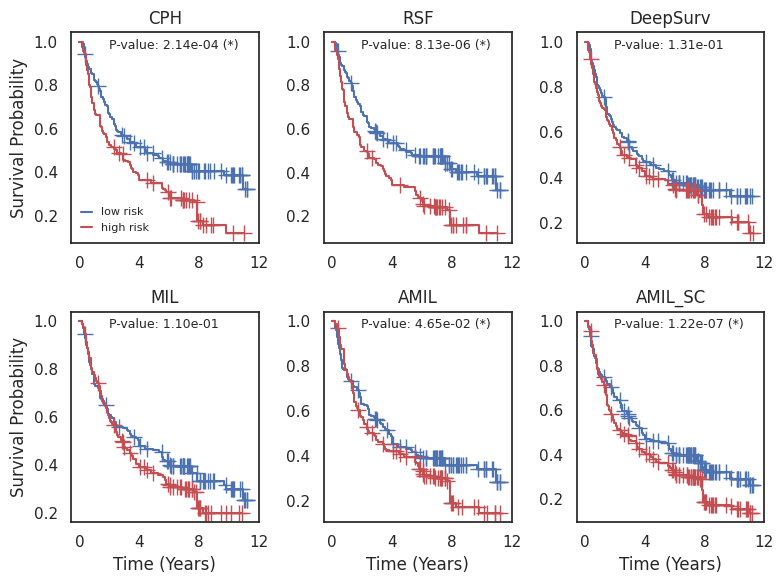

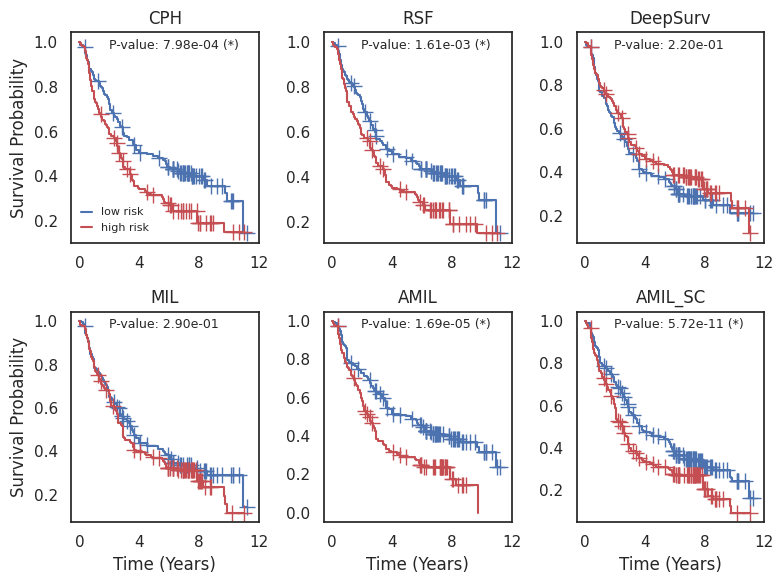

In [49]:
models = ['cph', 'rsf', 'deepsurv', 'mil', 'clam_noCl', 'clam_single']
titles = ['CPH', 'RSF', 'DeepSurv', 'MIL', 'AMIL', 'AMIL_SC']
splits = ['val', 'test']

for split in splits:
    
    fig, axs = plt.subplots(2, 3, figsize=(8,6))
    
    for idx, ax in enumerate(axs.flatten()):
        model = models[idx]
        
        times = np.concatenate(globals()[model + '_times'][split])
        events = np.concatenate(globals()[model + '_events'][split])
        preds = np.concatenate(globals()[model + '_preds'][split]).reshape(-1)
        groups = np.concatenate(globals()[model + '_group'][split]).reshape(-1)
        
        # create results df 
        df = pd.DataFrame({'time': times / 365, 'event': events, 'risk': preds, 'risk_group': groups})

        # perform logrank test with groups
        res = multivariate_logrank_test(df.time, df.risk_group, df.event)

        # fit kaplan-meier curves
        kmf = KaplanMeierFitter()
        for name, group_df in df.groupby('risk_group'):
            kmf.fit(group_df.time, group_df.event, label=label_dict[name])
            kmf.plot(show_censors=True, ci_show=False, color=color_dict[name], ax=ax)

        if res.p_value < 0.05:
            text = 'P-value: {:.2e} (*)'.format(res.p_value)
        else:
            text = 'P-value: {:.2e}'.format(res.p_value)
            
            
        if idx == 0:
            ax.legend(frameon=False, loc=3, fontsize=8, handlelength=1)
        else:
            ax.get_legend().remove()
        
        if idx == 0 or idx == 3:
            ax.set_ylabel('Survival Probability')
            
        if idx > 2:
            ax.set_xlabel('Time (Years)')
        else:
            ax.set_xlabel('')
            

        ax.text(0.2, 0.92, text, transform=ax.transAxes, fontsize=9)
        ax.set_title(titles[idx])
        ax.set_xticks([0, 4, 8, 12])
        ax.set_xticklabels([0, 4, 8, 12])
        
    plt.tight_layout()
    
#     # add rectangular areas
#     plt.axhspan(0.5, 1, 0.01, 0.99, facecolor='xkcd:pastel green', alpha=0.2)
#     plt.axhspan(0, 0.5, 0.01, 0.99, facecolor='xkcd:pale yellow', alpha=0.2)
    
    plt.savefig(os.path.join(plots_dir, 'km_all_{}.svg'.format(split)), bbox_inches='tight')
    plt.show()

### Visualize heatmaps


In [50]:
from pathlib import Path 

heatmap_dir = Path('../heatmaps/heatmap_production_results/HEATMAP_SURVIVAL_AUG/Unspecified/')
data_dir = Path('../heatmaps_wsi_aug/')
csv_file = '../heatmaps/process_lists/survival_aug.csv'

df = pd.read_csv(csv_file) 
df.head()

,slide_id,event
0,slide_001_00,lebt
1,slide_001_01,lebt
2,slide_001_02,lebt
3,slide_002_00,tod
4,slide_002_01,tod


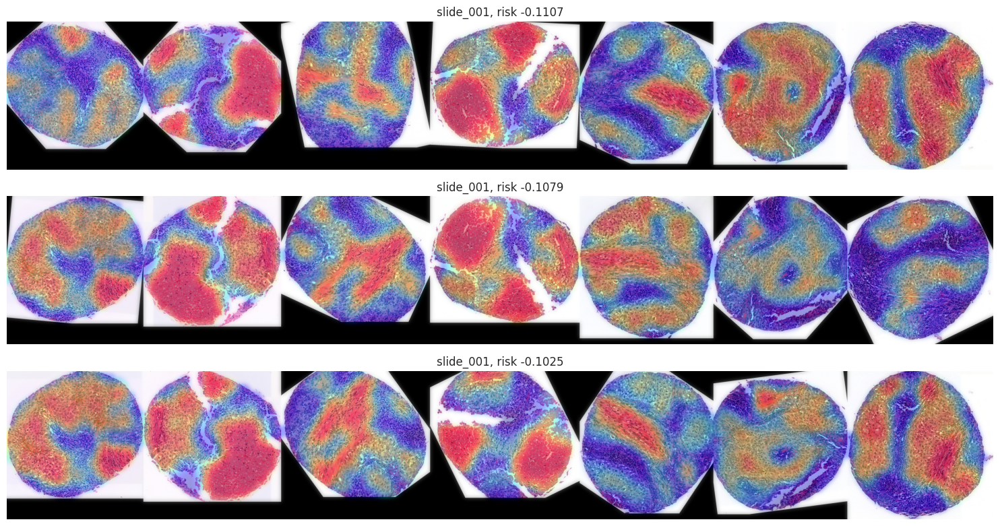

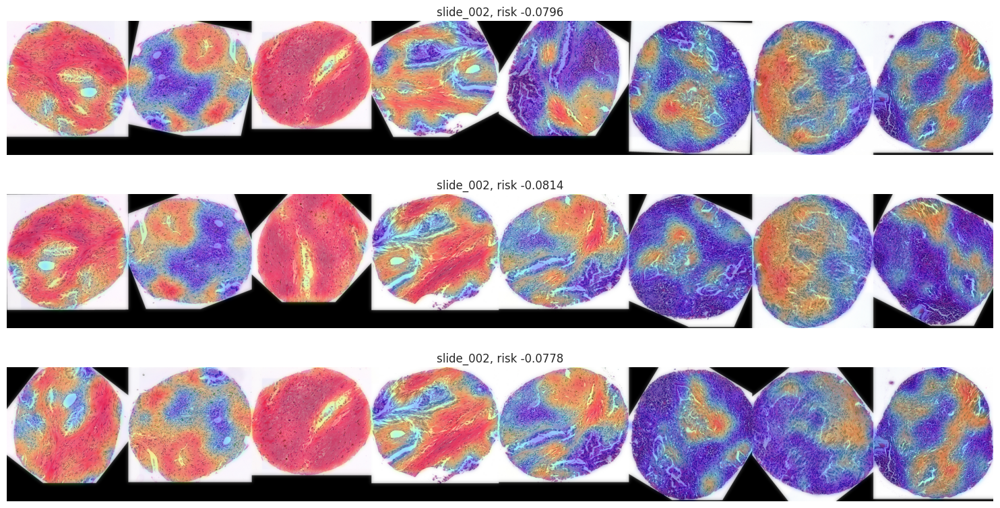

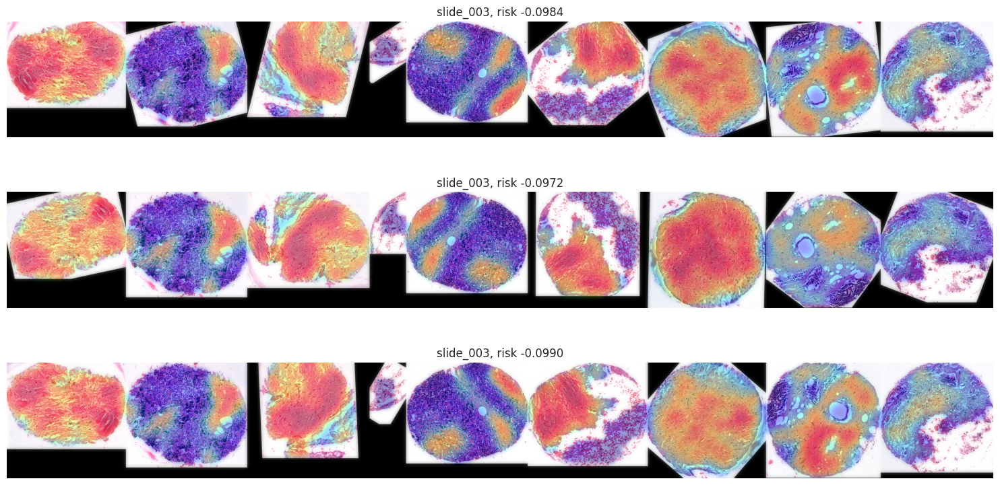

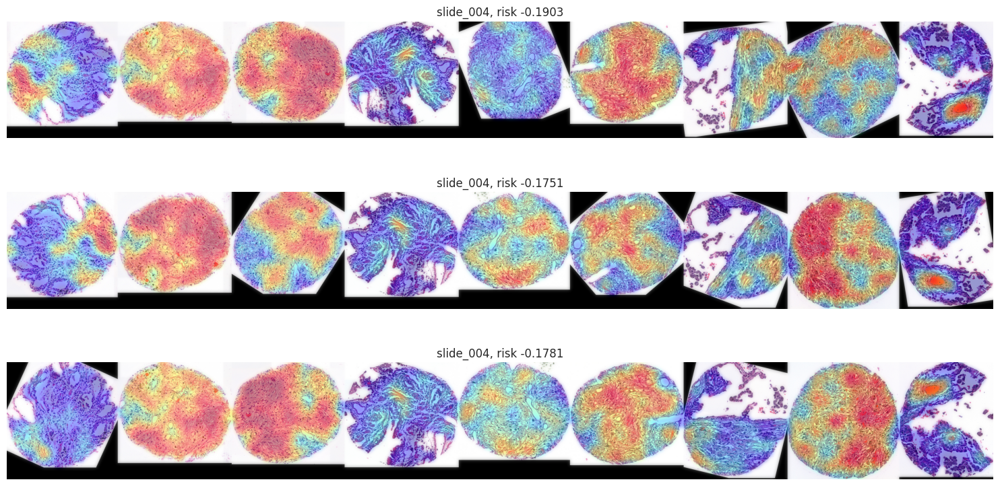

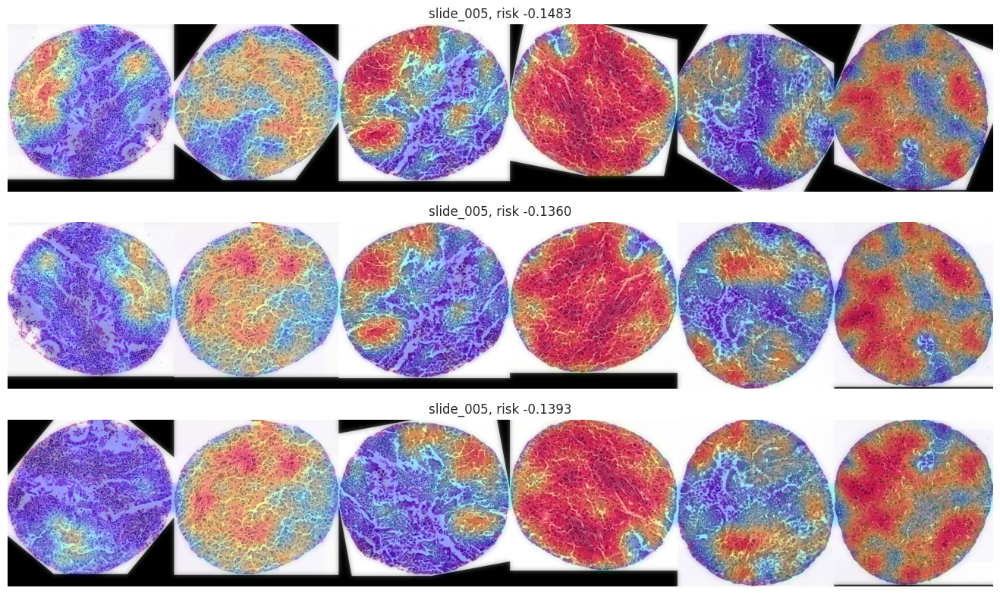

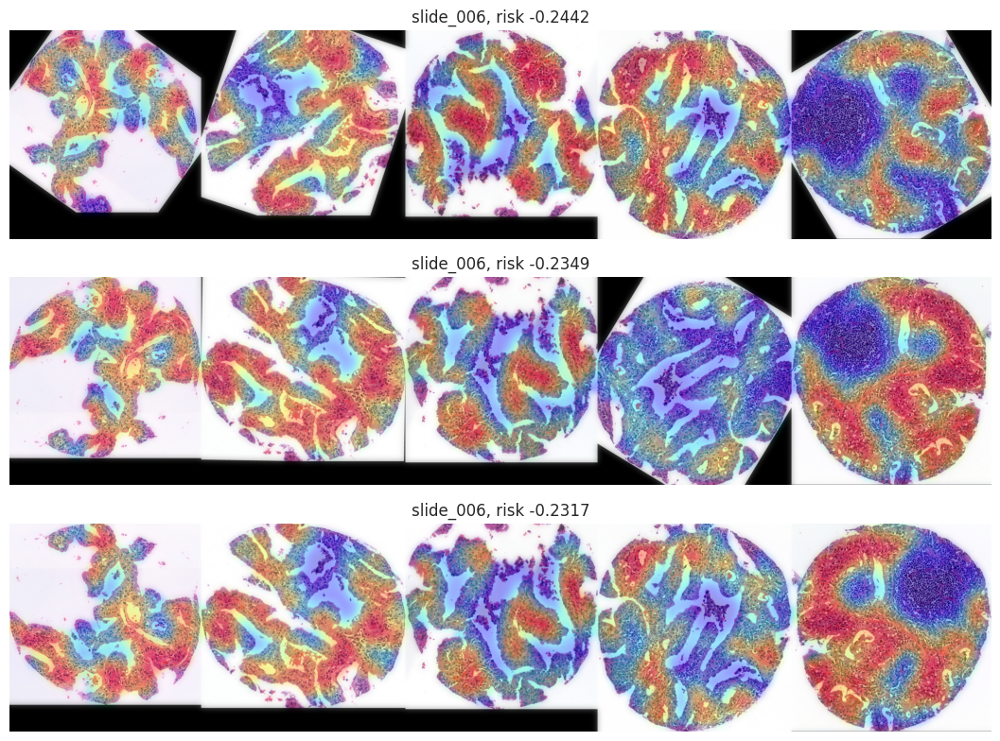

In [82]:
from PIL import Image 

slide_ids = sorted(list(set(df.slide_id.apply(lambda x: x[:-3]))))

for slide_id in slide_ids:

    heatmaps = list(heatmap_dir.glob(slide_id + '*' 'heatmap' + '*'))

    if len(heatmaps) == 0:
        break 

    fig, axs = plt.subplots(3, 1, figsize=(15,8))

    for idx, ax in enumerate(axs.flatten()):

        heatmap = str(heatmaps[idx])
        risk = heatmap.split('k')[1][:7]

        img = Image.open(heatmap)

        ax.imshow(img)
        ax.axis('off')
        ax.set_title('{}, risk {}'.format(slide_id, risk))

    plt.tight_layout()
    plt.show()